# Hands-on Image Processing with Python
## Chapter 2: Sampling & Fourier Transform 

## Author: Sandipan Dey

### Import libraries

In [21]:
# % matplotlib inline 
from PIL import Image
from skimage.io import imread, imshow, show
import scipy.fftpack as fp
from scipy import ndimage, misc, signal
# from scipy.stats import signaltonoise
from skimage import data, img_as_float
from skimage.color import rgb2gray
from skimage.transform import rescale
import matplotlib.pylab as pylab
import numpy as np
import numpy.fft
import timeit

### Up-Sampling

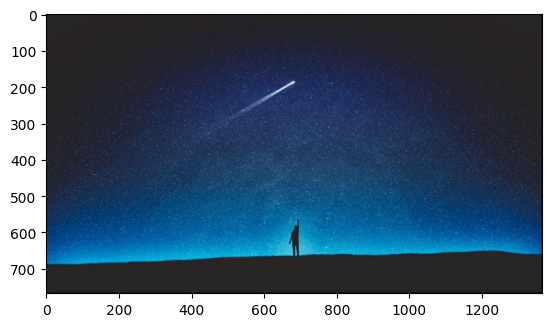

(<matplotlib.image.AxesImage at 0x281ac9b5f10>, None)

In [7]:
im = Image.open("../images/myImages/Chapter-2/scene.jpg") # the original small clock image
pylab.imshow(im), pylab.show()

C:\Users\manka\AppData\Local\Temp\ipykernel_6516\3036485647.py:1: DeprecationWarning: NEAREST is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.NEAREST or Dither.NONE instead.
  im1 = im.resize((im.width*5, im.height*5), Image.NEAREST) # nearest neighbor interpolation


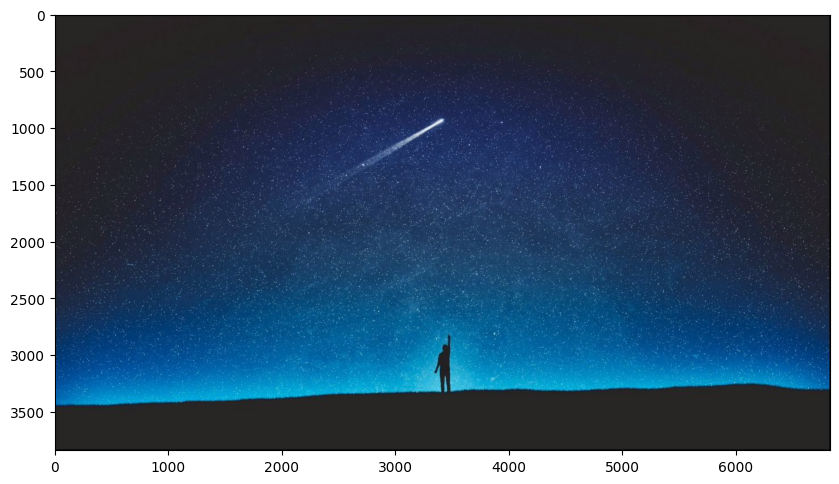

(<Figure size 1000x1000 with 1 Axes>,
 None)

In [8]:
im1 = im.resize((im.width*5, im.height*5), Image.NEAREST) # nearest neighbor interpolation
pylab.figure(figsize=(10,10)), pylab.imshow(im1), pylab.show()

C:\Users\manka\AppData\Local\Temp\ipykernel_6516\2794357491.py:1: DeprecationWarning: BILINEAR is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.BILINEAR instead.
  im1 = im.resize((im.width*5, im.height*5), Image.BILINEAR) # up-sample with bi-linear interpolation


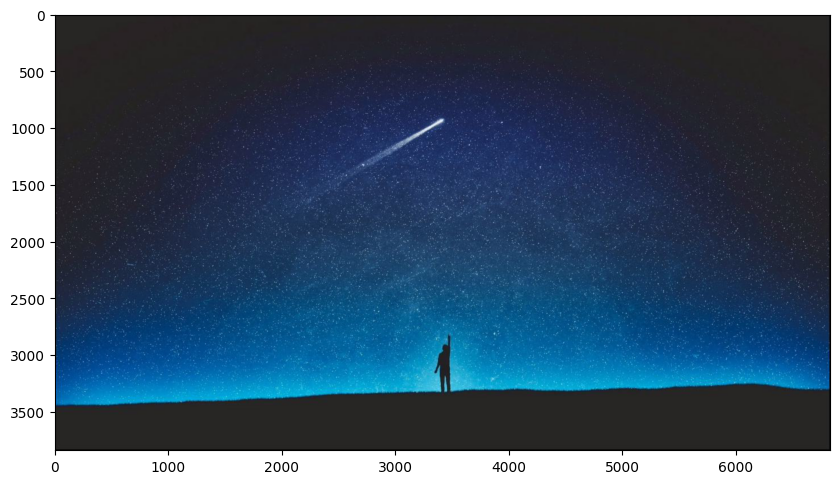

(<Figure size 1000x1000 with 1 Axes>,
 None)

In [9]:
im1 = im.resize((im.width*5, im.height*5), Image.BILINEAR) # up-sample with bi-linear interpolation
pylab.figure(figsize=(10,10)), pylab.imshow(im1), pylab.show()

C:\Users\manka\AppData\Local\Temp\ipykernel_6516\2834882535.py:1: DeprecationWarning: BICUBIC is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.BICUBIC instead.
  im.resize((im.width*10, im.height*10), Image.BICUBIC).show() # bi-cubic interpolation


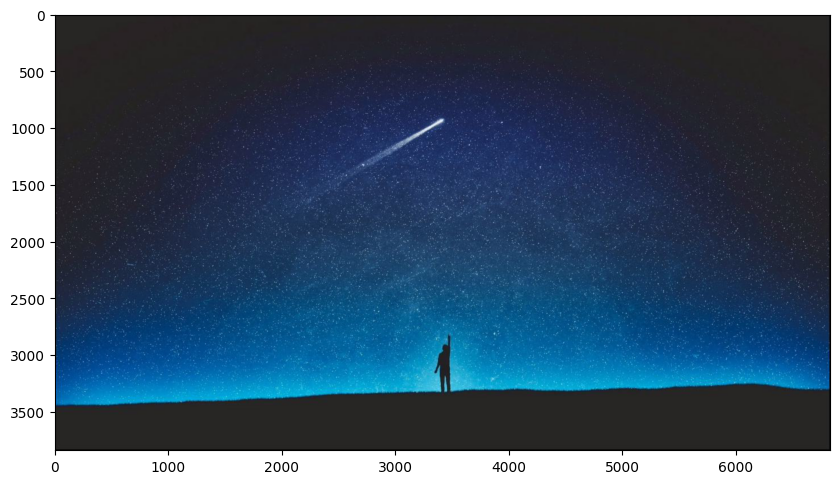

(<Figure size 1000x1000 with 1 Axes>,
 None)

In [10]:
im.resize((im.width*10, im.height*10), Image.BICUBIC).show() # bi-cubic interpolation
pylab.figure(figsize=(10,10)), pylab.imshow(im1), pylab.show()

### Down-sampling

In [11]:
im = Image.open("../images/myImages/Chapter-2/scene.jpg")
im.show()

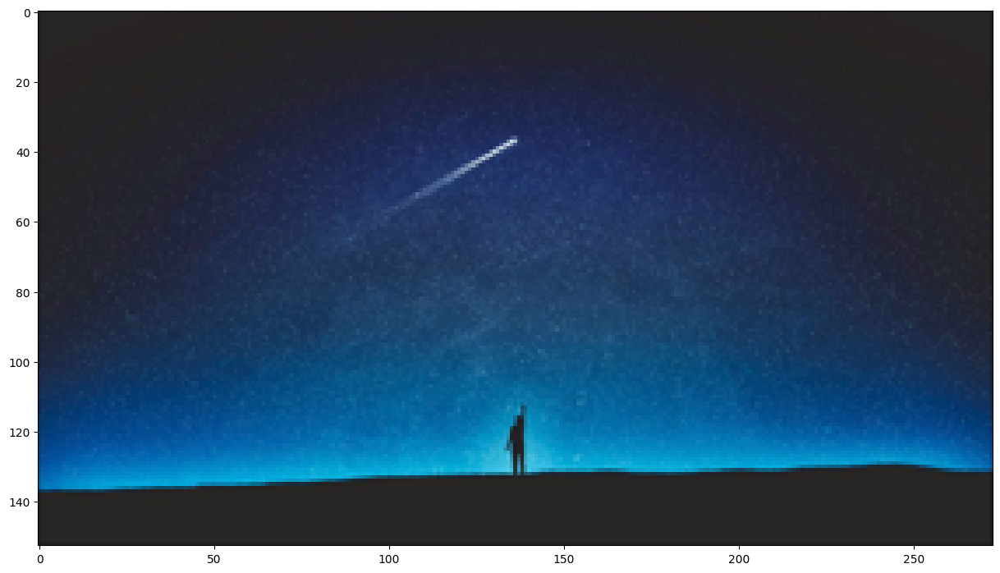

(<Figure size 1500x1000 with 1 Axes>,
 None)

In [12]:
im = im.resize((im.width//5, im.height//5))
pylab.figure(figsize=(15,10)), pylab.imshow(im), pylab.show()

C:\Users\manka\AppData\Local\Temp\ipykernel_6516\858974727.py:2: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  im = im.resize((im.width//5, im.height//5), Image.ANTIALIAS)


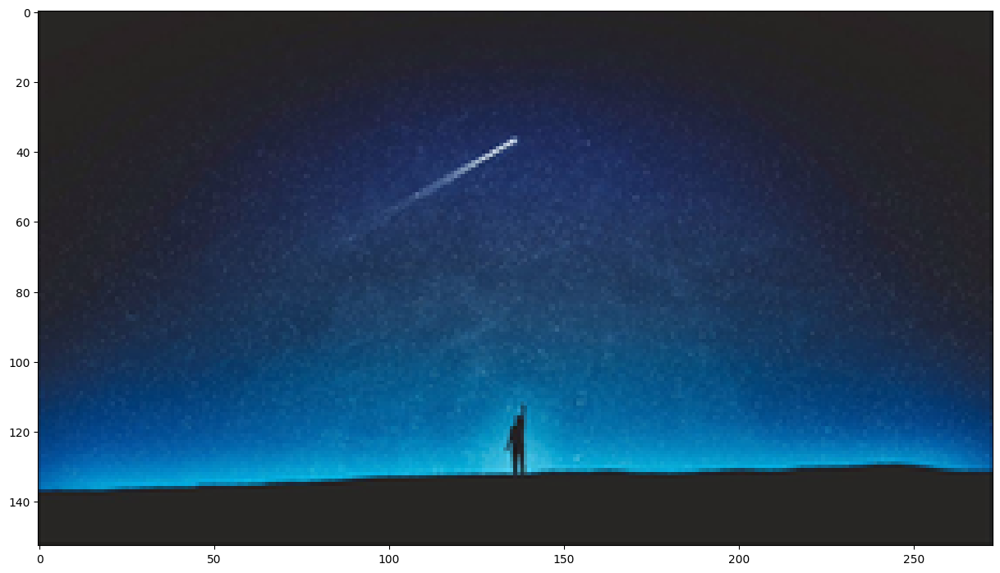

(<Figure size 1500x1000 with 1 Axes>,
 None)

In [14]:
im = Image.open("../images/myImages/Chapter-2/scene.jpg")
im = im.resize((im.width//5, im.height//5), Image.ANTIALIAS)
pylab.figure(figsize=(15,10)), pylab.imshow(im), pylab.show()

C:\Users\manka\AppData\Local\Temp\ipykernel_6516\2644648811.py:7: FutureWarning: `multichannel` is a deprecated argument name for `rescale`. It will be removed in version 1.0. Please use `channel_axis` instead.
  im1 = rescale(im1, scale = 0.5, multichannel=True, anti_aliasing=False)


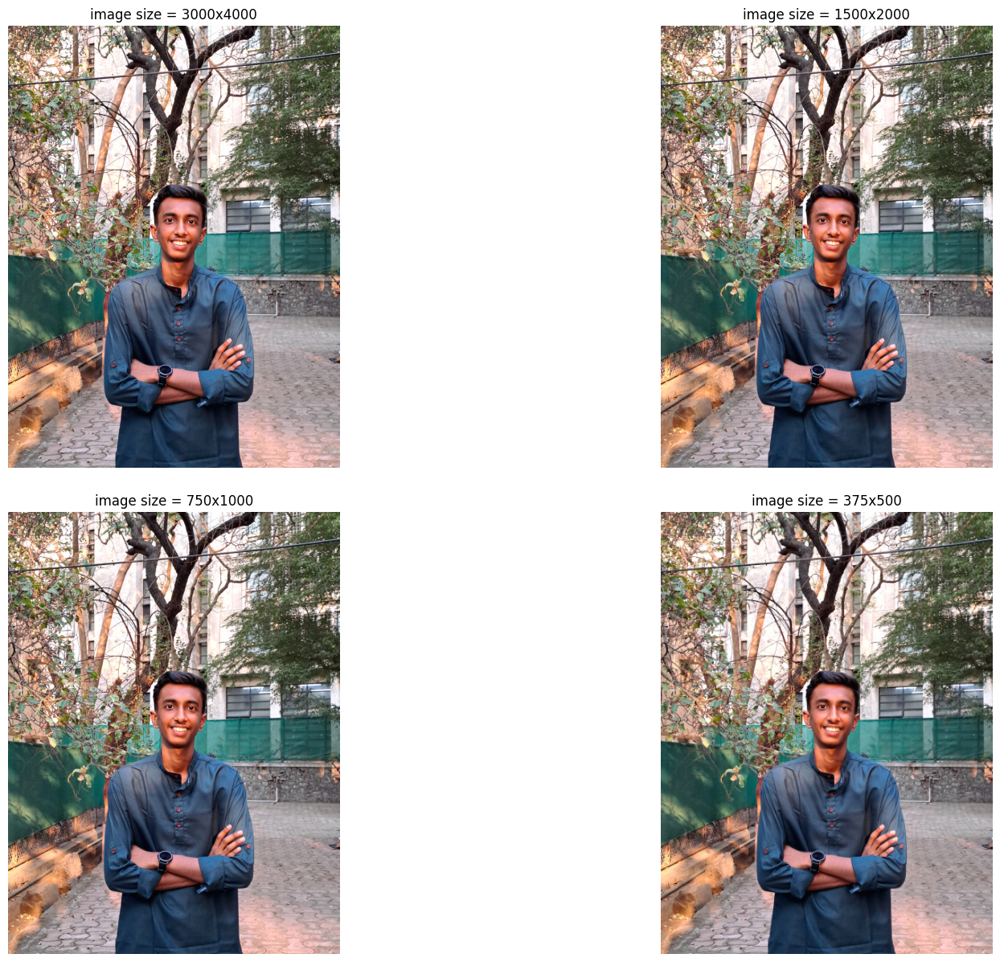

In [16]:
im = imread('../images/myImages/Chapter-2/myImage.png')
im1 = im.copy()
pylab.figure(figsize=(20,15))
for i in range(4):
    pylab.subplot(2,2,i+1), pylab.imshow(im1, cmap='gray'), pylab.axis('off')
    pylab.title('image size = ' + str(im1.shape[1]) + 'x' + str(im1.shape[0]))
    im1 = rescale(im1, scale = 0.5, multichannel=True, anti_aliasing=False)
pylab.subplots_adjust(wspace=0.1, hspace=0.1)
pylab.show()

In [15]:
im1 = rescale(im1, scale = 0.5, multichannel=True, anti_aliasing=True)

C:\Users\Sandipan.Dey\Anaconda\envs\ana41py35\lib\site-packages\skimage\transform\_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "


### Quantizing with PIL

In [22]:
# im = Image.open('../images/myImages/Chapter-2/scene.jpg')
# pylab.figure(figsize=(20,30))
# num_colors_list = [1 << n for n in range(8,0,-1)]
# snr_list = []
# i = 1
# for num_colors in num_colors_list:
#     im1 = im.convert('P', palette=Image.ADAPTIVE, colors=num_colors)
#     pylab.subplot(4,2,i), pylab.imshow(im1), pylab.axis('off')
#     # snr_list.append(signaltonoise(im1, axis=None))
#     pylab.title('Image with # colors = ' + str(num_colors) + ' SNR = ' +
#     str(np.round(snr_list[i-1],3)), size=20)
#     i += 1
# pylab.subplots_adjust(wspace=0.2, hspace=0)
# pylab.show()

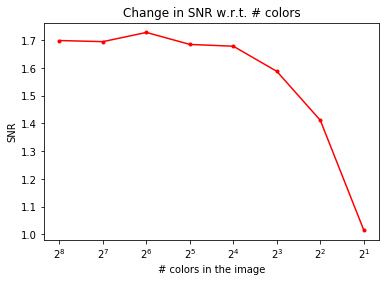

In [20]:
# pylab.plot(num_colors_list, snr_list, 'r.-')
# pylab.xlabel('# colors in the image')
# pylab.ylabel('SNR')
# pylab.title('Change in SNR w.r.t. # colors')
# pylab.xscale('log', basex=2)
# pylab.gca().invert_xaxis()
# pylab.show()

### FFT with the scipy.fftpack module

C:\Users\Sandipan.Dey\Anaconda\envs\ana41py35\lib\site-packages\ipykernel_launcher.py:2: DeprecationWarning: `signaltonoise` is deprecated!
scipy.stats.signaltonoise is deprecated in scipy 0.16.0
  


SNR for the original image = 2.023722773801701


C:\Users\Sandipan.Dey\Anaconda\envs\ana41py35\lib\site-packages\ipykernel_launcher.py:8: DeprecationWarning: `signaltonoise` is deprecated!
scipy.stats.signaltonoise is deprecated in scipy 0.16.0
  


SNR for the image obtained after reconstruction = 2.023722773801701


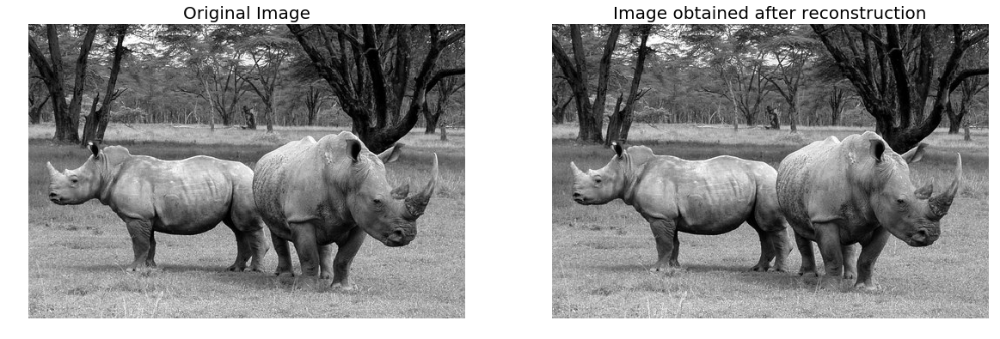

In [22]:
# im = np.array(Image.open('../images/rhino.jpg').convert('L')) # we shall work with grayscale image
# snr = signaltonoise(im, axis=None)
# print('SNR for the original image = ' + str(snr))
# # SNR for the original image = 2.023722773801701
# # now call FFT and IFFT
# freq = fp.fft2(im)
# im1 = fp.ifft2(freq).real
# snr = signaltonoise(im1, axis=None)
# print('SNR for the image obtained after reconstruction = ' + str(snr))
# # SNR for the image obtained after reconstruction = 2.0237227738013224
# assert(np.allclose(im, im1)) # make sure the forward and inverse FFT are close to each other
# pylab.figure(figsize=(20,10))
# pylab.subplot(121), pylab.imshow(im, cmap='gray'), pylab.axis('off')
# pylab.title('Original Image', size=20)
# pylab.subplot(122), pylab.imshow(im1, cmap='gray'), pylab.axis('off')
# pylab.title('Image obtained after reconstruction', size=20)
# pylab.show()

C:\Users\Sandipan.Dey\Anaconda\envs\ana41py35\lib\site-packages\ipykernel_launcher.py:3: ComplexWarning: Casting complex values to real discards the imaginary part
  This is separate from the ipykernel package so we can avoid doing imports until


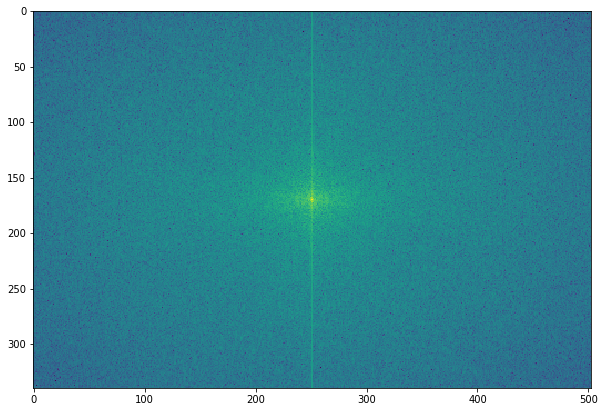

(<matplotlib.figure.Figure at 0x1b7f4bf3898>,
 None)

In [25]:
# # the quadrants are needed to be shifted around in order that the low spatial frequencies are in the center of the 2D fourier-transformed image.
# freq2 = fp.fftshift(freq)
# pylab.figure(figsize=(10,10)), pylab.imshow( (20*np.log10( 0.1 + freq2)).astype(int)), pylab.show()

### FFT with the numpy.fft module

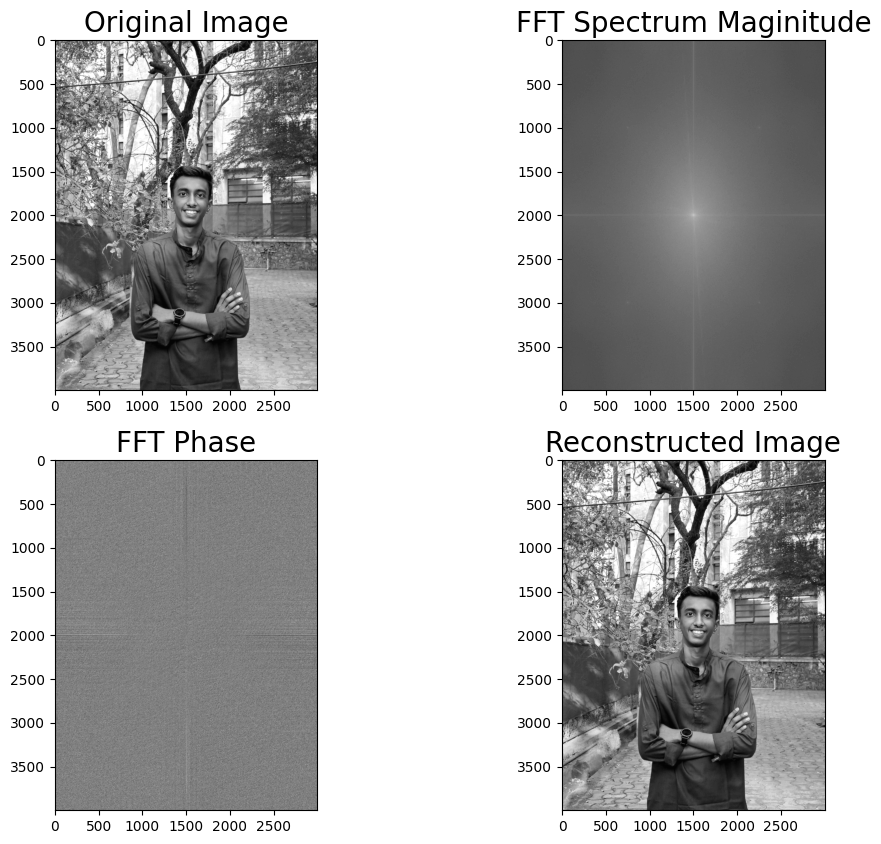

In [23]:
import numpy.fft as fp
im1 = rgb2gray(imread('../images/myImages/Chapter-2/myImage.png'))
pylab.figure(figsize=(12,10))
freq1 = fp.fft2(im1)
im1_ = fp.ifft2(freq1).real
pylab.subplot(2,2,1), pylab.imshow(im1, cmap='gray'), pylab.title('Original Image', size=20)
pylab.subplot(2,2,2), pylab.imshow(20*np.log10( 0.01 +
np.abs(fp.fftshift(freq1))), cmap='gray')
pylab.title('FFT Spectrum Maginitude', size=20)
pylab.subplot(2,2,3), pylab.imshow(np.angle(fp.fftshift(freq1)),cmap='gray')
pylab.title('FFT Phase', size=20)
pylab.subplot(2,2,4), pylab.imshow(np.clip(im1_,0,255), cmap='gray')
pylab.title('Reconstructed Image', size=20)
pylab.show()

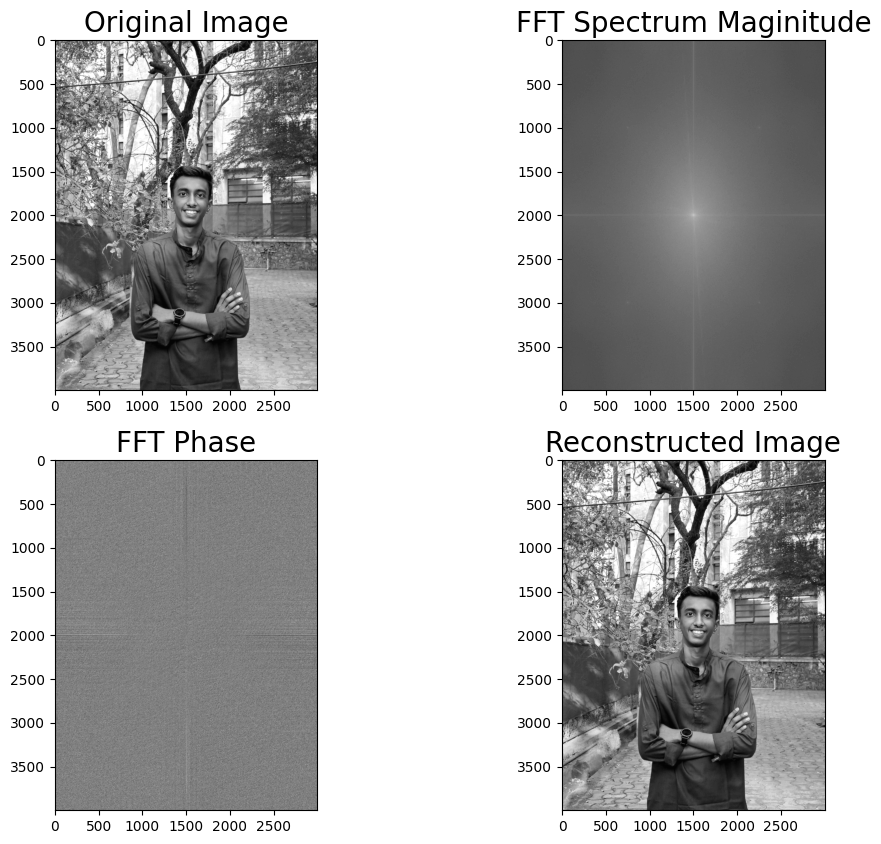

In [24]:
im2 = rgb2gray(imread('../images/myImages/Chapter-2/myImage.png'))
pylab.figure(figsize=(12,10))
freq2 = fp.fft2(im2)
im2_ = fp.ifft2(freq2).real
pylab.subplot(2,2,1), pylab.imshow(im2, cmap='gray'), pylab.title('Original Image', size=20)
pylab.subplot(2,2,2), pylab.imshow(20*np.log10( 0.01 +
np.abs(fp.fftshift(freq2))), cmap='gray')
pylab.title('FFT Spectrum Maginitude', size=20)
pylab.subplot(2,2,3), pylab.imshow(np.angle(fp.fftshift(freq2)), cmap='gray')
pylab.title('FFT Phase', size=20)
pylab.subplot(2,2,4), pylab.imshow(np.clip(im2_,0,255), cmap='gray')
pylab.title('Reconstructed Image', size=20)
pylab.show()

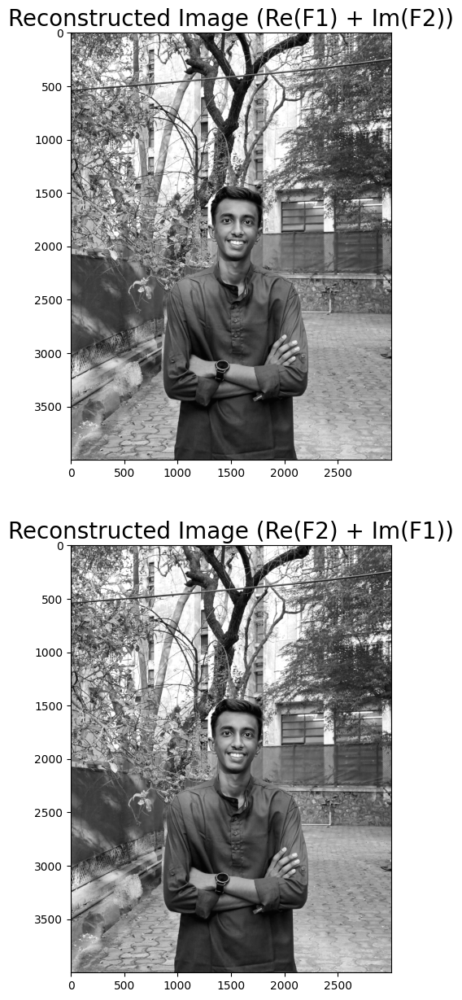

In [25]:
pylab.figure(figsize=(20,15))
im1_ = fp.ifft2(np.vectorize(complex)(freq1.real, freq2.imag)).real
im2_ = fp.ifft2(np.vectorize(complex)(freq2.real, freq1.imag)).real
pylab.subplot(211), pylab.imshow(np.clip(im1_,0,255), cmap='gray')
pylab.title('Reconstructed Image (Re(F1) + Im(F2))', size=20)
pylab.subplot(212), pylab.imshow(np.clip(im2_,0,255), cmap='gray')
pylab.title('Reconstructed Image (Re(F2) + Im(F1))', size=20)
pylab.show()

### Applying convolution to a grayscale image

0.9891666666666667
(768, 1366)


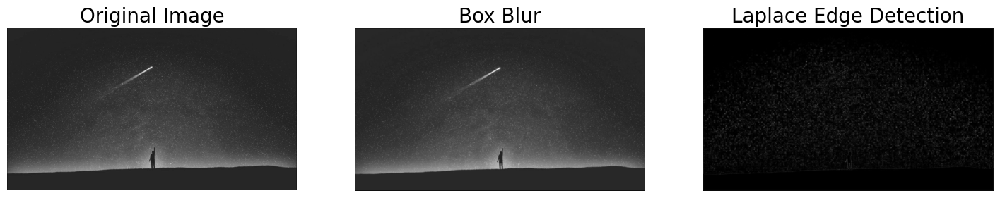

In [26]:
im = rgb2gray(imread('../images/myImages/Chapter-2/scene.jpg')).astype(float)
print(np.max(im))
print(im.shape)
blur_box_kernel = np.ones((3,3)) / 9
edge_laplace_kernel = np.array([[0,1,0],[1,-4,1],[0,1,0]])
im_blurred = signal.convolve2d(im, blur_box_kernel)
im_edges = np.clip(signal.convolve2d(im, edge_laplace_kernel), 0, 1)
fig, axes = pylab.subplots(ncols=3, sharex=True, sharey=True, figsize=(18,6))
axes[0].imshow(im, cmap=pylab.cm.gray)
axes[0].set_title('Original Image', size=20)
axes[1].imshow(im_blurred, cmap=pylab.cm.gray)
axes[1].set_title('Box Blur', size=20)
axes[2].imshow(im_edges, cmap=pylab.cm.gray)
axes[2].set_title('Laplace Edge Detection', size=20)
for ax in axes:
    ax.axis('off')
pylab.show()

### Applying convolution to a color (RGB) image

1.0
(768, 1366, 3)


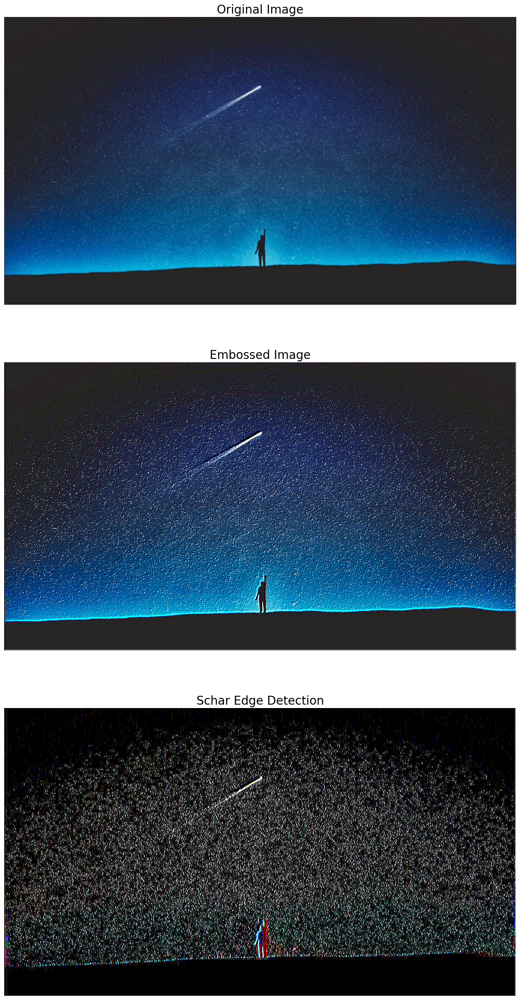

In [28]:
im = imread('../images/myImages/Chapter-2/scene.jpg')/255 # scale each pixel value in [0,1]
print(np.max(im))
print(im.shape)
emboss_kernel = np.array([[-2,-1,0],[-1,1,1],[0,1,2]])
edge_schar_kernel = np.array([[ -3-3j, 0-10j, +3 -3j], [-10+0j, 0+ 0j, +10+0j], [ -3+3j, 0+10j, +3 +3j]])
im_embossed = np.ones(im.shape)
im_edges = np.ones(im.shape)
for i in range(3):
    im_embossed[...,i] = np.clip(signal.convolve2d(im[...,i], emboss_kernel, mode='same', boundary="symm"),0,1)
for i in range(3):
    im_edges[:,:,i] = np.clip(np.real(signal.convolve2d(im[...,i], edge_schar_kernel, mode='same', boundary="symm")),0,1)
fig, axes = pylab.subplots(nrows=3, figsize=(20, 30))
axes[0].imshow(im)
axes[0].set_title('Original Image', size=20)
axes[1].imshow(im_embossed)
axes[1].set_title('Embossed Image', size=20)
axes[2].imshow(im_edges)
axes[2].set_title('Schar Edge Detection', size=20)
for ax in axes:
    ax.axis('off')
pylab.show()

### Convolution with SciPy ndimage.convolve

C:\Users\manka\AppData\Local\Temp\ipykernel_6516\4207321510.py:1: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  im = imread('../images/myImages/Chapter-2/scene.jpg').astype(np.float) # read as float


255.0


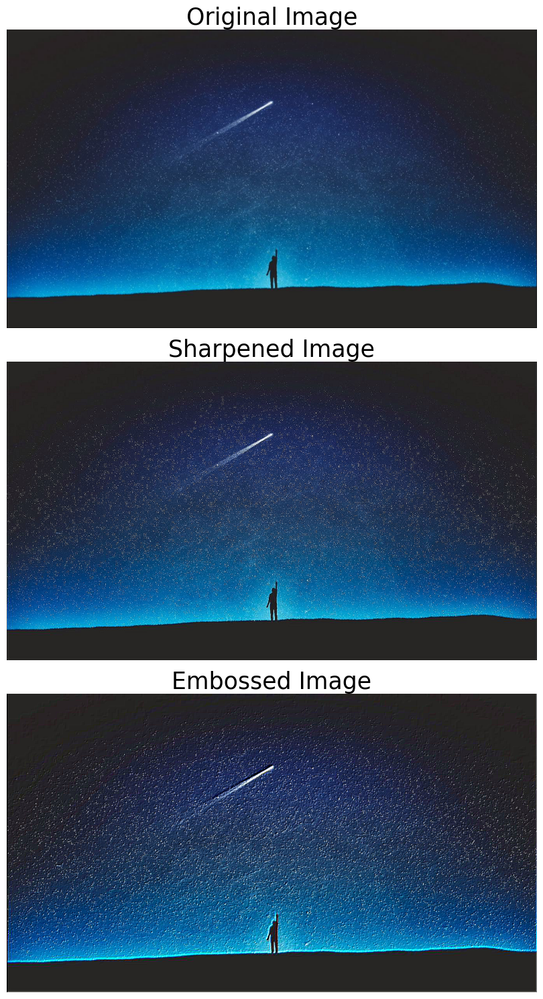

In [30]:
im = imread('../images/myImages/Chapter-2/scene.jpg').astype(np.float) # read as float
print(np.max(im))
sharpen_kernel = np.array([0, -1, 0, -1, 5, -1, 0, -1, 0]).reshape((3, 3, 1))
emboss_kernel = np.array(np.array([[-2,-1,0],[-1,1,1],[0,1,2]])).reshape((3, 3, 1))
im_sharp = ndimage.convolve(im, sharpen_kernel, mode='nearest')
im_sharp = np.clip(im_sharp, 0, 255).astype(np.uint8) # clip (0 to 255) and convert to unsigned int
im_emboss = ndimage.convolve(im, emboss_kernel, mode='nearest')
im_emboss = np.clip(im_emboss, 0, 255).astype(np.uint8)
pylab.figure(figsize=(10,15))
pylab.subplot(311), pylab.imshow(im.astype(np.uint8)), pylab.axis('off')
pylab.title('Original Image', size=25)
pylab.subplot(312), pylab.imshow(im_sharp), pylab.axis('off')
pylab.title('Sharpened Image', size=25)
pylab.subplot(313), pylab.imshow(im_emboss), pylab.axis('off')
pylab.title('Embossed Image', size=25)
pylab.tight_layout()
pylab.show()

### Template matching with cross-correlation between the image and template

C:\Users\manka\AppData\Local\Temp\ipykernel_6516\2362954383.py:18: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


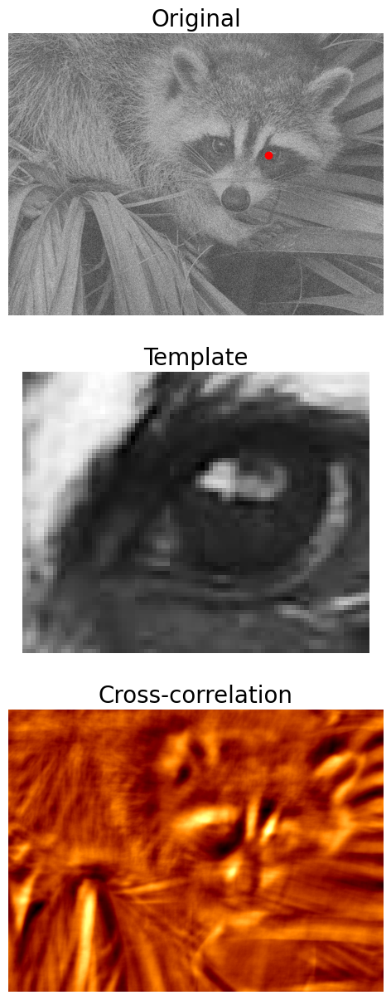

In [31]:
face_image = misc.face(gray=True) - misc.face(gray=True).mean()
template_image = np.copy(face_image[300:365, 670:750]) # right eye
template_image -= template_image.mean()
face_image = face_image + np.random.randn(*face_image.shape) * 50 # add random noise
correlation = signal.correlate2d(face_image, template_image, boundary='symm', mode='same')
y, x = np.unravel_index(np.argmax(correlation), correlation.shape) # find the match
fig, (ax_original, ax_template, ax_correlation) = pylab.subplots(3, 1, figsize=(6, 15))
ax_original.imshow(face_image, cmap='gray')
ax_original.set_title('Original', size=20)
ax_original.set_axis_off()
ax_template.imshow(template_image, cmap='gray')
ax_template.set_title('Template', size=20)
ax_template.set_axis_off()
ax_correlation.imshow(correlation, cmap='afmhot')
ax_correlation.set_title('Cross-correlation', size=20)
ax_correlation.set_axis_off()
ax_original.plot(x, y, 'ro')
fig.show()